In [ ]:
!pip -q install --upgrade \
    "open3d==0.19.0" \
    "transformers>=4.46,<6" \
    accelerate \
    safetensors \
    plotly \
    ipywidgets

print(" Installation completed")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 83.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.2/389.2 kB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.0/516.0 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 111.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 81.8 MB/s eta 0:00:00:00:0100:01
 Installation completed


In [ ]:
import io

import ipywidgets as widgets
from IPython.display import display
from PIL import Image

uploader = widgets.FileUpload(
    accept="image/*",
    multiple=False,
)

display(uploader)
print("رفع صورة الغرفة")

FileUpload(value=(), accept='image/*', description='Upload')

رفع صورة الغرفة


In [3]:
if len(uploader.value) == 0:
    raise RuntimeError("لم يتم ايجاد الصورة يرجى رفع الصورة ")

# Compatible with different ipywidgets versions.
if isinstance(uploader.value, dict):
    uploaded_item = next(iter(uploader.value.values()))
else:
    uploaded_item = uploader.value[0]

if isinstance(uploaded_item, dict):
    content = uploaded_item["content"]
else:
    content = uploaded_item.content

image = Image.open(io.BytesIO(content)).convert("RGB")
IMAGE_PATH = "/kaggle/working/input_room.jpg"
image.save(IMAGE_PATH, quality=95)

print("Image saved to:", IMAGE_PATH)

Image saved to: /kaggle/working/input_room.jpg


 Image ready
Size: 853 x 1280


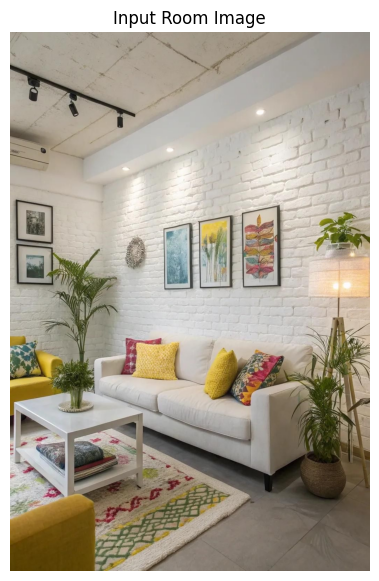

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

image = Image.open(IMAGE_PATH)
image = ImageOps.exif_transpose(image).convert("RGB")

MAX_SIDE = 1280
if max(image.size) > MAX_SIDE:
    image.thumbnail((MAX_SIDE, MAX_SIDE), Image.Resampling.LANCZOS)

rgb = np.asarray(image, dtype=np.uint8)
H, W = rgb.shape[:2]

print(" Image ready")
print("Size:", W, "x", H)

plt.figure(figsize=(12, 7))
plt.imshow(image)
plt.axis("off")
plt.title("Input Room Image")
plt.show()

Device: cuda
Loading model: depth-anything/Depth-Anything-V2-Metric-Indoor-Small-hf


preprocessor_config.json:   0%|          | 0.00/437 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/99.2M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]


 Raw metric depth ready
Raw metric range: 1.480974793434143 → 7.5884108543396

Mesh far cap: 7.421626091003418
Extreme far pixels capped: 3276

 Mesh depth ready
Mesh depth range: 1.495213508605957 → 7.42162561416626

 Saved: /kaggle/working/depth_raw_metric.npy
 Saved: /kaggle/working/depth_mesh.npy


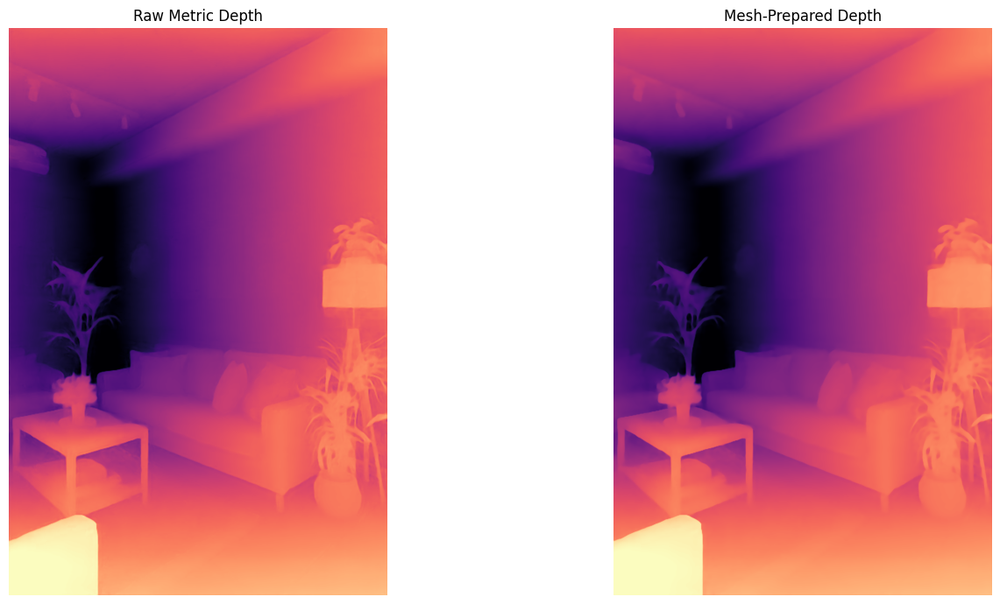


 Raw and mesh depth visualizations saved


In [ ]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from transformers import AutoImageProcessor, AutoModelForDepthEstimation

MODEL_ID = "depth-anything/Depth-Anything-V2-Metric-Indoor-Small-hf"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)
print("Loading model:", MODEL_ID)

processor = AutoImageProcessor.from_pretrained(MODEL_ID)
model = AutoModelForDepthEstimation.from_pretrained(MODEL_ID).to(DEVICE)
model.eval()

inputs = processor(images=image, return_tensors="pt")
inputs = {key: value.to(DEVICE) for key, value in inputs.items()}

with torch.inference_mode():
    outputs = model(**inputs)

post_processed = processor.post_process_depth_estimation(
    outputs,
    target_sizes=[(H, W)],
)

depth_raw_metric = (
    post_processed[0]["predicted_depth"]
    .detach()
    .cpu()
    .numpy()
    .astype(np.float32)
)

raw_valid_mask = np.isfinite(depth_raw_metric) & (depth_raw_metric > 0.0)
depth_raw_metric[~raw_valid_mask] = 0.0
valid_raw_values = depth_raw_metric[raw_valid_mask]

if valid_raw_values.size == 0:
    raise RuntimeError(" Model returned no valid metric depth.")

print("\n Raw metric depth ready")
print(
    "Raw metric range:",
    float(valid_raw_values.min()),
    "→",
    float(valid_raw_values.max()),
)

depth_for_mesh = depth_raw_metric.copy()
far_cap = float(np.percentile(valid_raw_values, 99.7))
extreme_far_mask = raw_valid_mask & (depth_for_mesh > far_cap)
depth_for_mesh[extreme_far_mask] = far_cap

print("\nMesh far cap:", far_cap)
print("Extreme far pixels capped:", int(extreme_far_mask.sum()))

depth_mesh = cv2.bilateralFilter(
    depth_for_mesh.astype(np.float32),
    d=9,
    sigmaColor=0.15,
    sigmaSpace=9,
)
depth_mesh[~raw_valid_mask] = 0.0

mesh_valid_mask = np.isfinite(depth_mesh) & (depth_mesh > 0.0)
valid_mesh_values = depth_mesh[mesh_valid_mask]

if valid_mesh_values.size == 0:
    raise RuntimeError(" depth_mesh contains no valid values.")

print("\n Mesh depth ready")
print(
    "Mesh depth range:",
    float(valid_mesh_values.min()),
    "→",
    float(valid_mesh_values.max()),
)

RAW_DEPTH_PATH = "/kaggle/working/depth_raw_metric.npy"
MESH_DEPTH_PATH = "/kaggle/working/depth_mesh.npy"
np.save(RAW_DEPTH_PATH, depth_raw_metric)
np.save(MESH_DEPTH_PATH, depth_mesh)

print("\n Saved:", RAW_DEPTH_PATH)
print(" Saved:", MESH_DEPTH_PATH)


def normalize_depth_for_display(depth_map):
    valid = np.isfinite(depth_map) & (depth_map > 0)
    vis = np.zeros_like(depth_map, dtype=np.float32)

    if not np.any(valid):
        return vis

    p1, p99 = np.percentile(depth_map[valid], [1, 99])
    vis[valid] = np.clip(
        (depth_map[valid] - p1) / (p99 - p1 + 1e-8),
        0.0,
        1.0,
    )
    return vis


depth_raw_vis = normalize_depth_for_display(depth_raw_metric)
depth_mesh_vis = normalize_depth_for_display(depth_mesh)

plt.figure(figsize=(16, 7))
plt.subplot(1, 2, 1)
plt.imshow(depth_raw_vis, cmap="magma_r")
plt.axis("off")
plt.title("Raw Metric Depth")

plt.subplot(1, 2, 2)
plt.imshow(depth_mesh_vis, cmap="magma_r")
plt.axis("off")
plt.title("Mesh-Prepared Depth")

plt.tight_layout()
plt.show()

plt.imsave(
    "/kaggle/working/depth_raw_metric_vis.png",
    depth_raw_vis,
    cmap="magma_r",
)
plt.imsave(
    "/kaggle/working/depth_mesh_vis.png",
    depth_mesh_vis,
    cmap="magma_r",
)

print("\n Raw and mesh depth visualizations saved")

In [ ]:
import math

import numpy as np
import open3d as o3d

print("Open3D version:", o3d.__version__)

FALLBACK_LONG_SIDE_FOV_DEG = 75.0


def exif_value_to_float(value):
    try:
        return float(value)
    except Exception:
        try:
            return float(value.numerator) / float(value.denominator)
        except Exception:
            return None


cx = (W - 1) / 2.0
cy = (H - 1) / 2.0

f35_mm = None
try:
    exif = image.getexif()
    if exif is not None:
        raw_f35 = exif.get(41989, None)  
        if raw_f35 is not None:
            f35_mm = exif_value_to_float(raw_f35)
except Exception as exc:
    print("EXIF focal read warning:", repr(exc))

if f35_mm is not None and np.isfinite(f35_mm) and f35_mm > 0:
    full_frame_diag_mm = math.sqrt(36.0**2 + 24.0**2)
    image_diag_px = math.sqrt(float(W) ** 2 + float(H) ** 2)
    focal_px = image_diag_px * float(f35_mm) / full_frame_diag_mm
    INTRINSICS_SOURCE = f"EXIF 35mm-equivalent focal ≈ {f35_mm:.3f} mm"
else:
    long_side_px = float(max(W, H))
    focal_px = (long_side_px / 2.0) / math.tan(
        math.radians(FALLBACK_LONG_SIDE_FOV_DEG / 2.0)
    )
    INTRINSICS_SOURCE = (
        f"Fallback long-side FOV = {FALLBACK_LONG_SIDE_FOV_DEG:.1f}°"
    )

fx = float(focal_px)
fy = float(focal_px)

HFOV_DEG = math.degrees(2.0 * math.atan(float(W) / (2.0 * fx)))
VFOV_DEG = math.degrees(2.0 * math.atan(float(H) / (2.0 * fy)))

K_np = np.array(
    [
        [fx, 0.0, cx],
        [0.0, fy, cy],
        [0.0, 0.0, 1.0],
    ],
    dtype=np.float32,
)
K_inv_np = np.linalg.inv(K_np).astype(np.float32)

print("\n Camera intrinsics ready")
print("Source:", INTRINSICS_SOURCE)
print("fx =", fx)
print("fy =", fy)
print("cx =", cx)
print("cy =", cy)
print("Horizontal FOV =", HFOV_DEG, "deg")
print("Vertical FOV =", VFOV_DEG, "deg")

intrinsic = o3d.camera.PinholeCameraIntrinsic(W, H, fx, fy, cx, cy)

rgb_contiguous = np.ascontiguousarray(rgb.astype(np.uint8))
depth_contiguous = np.ascontiguousarray(depth_mesh.astype(np.float32))

color_o3d = o3d.geometry.Image(rgb_contiguous)
depth_o3d = o3d.geometry.Image(depth_contiguous)

rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(
    color_o3d,
    depth_o3d,
    depth_scale=1.0,
    depth_trunc=20.0,
    convert_rgb_to_intensity=False,
)

pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, intrinsic)


flip_transform = np.array(
    [
        [1.0, 0.0, 0.0, 0.0],
        [0.0, -1.0, 0.0, 0.0],
        [0.0, 0.0, -1.0, 0.0],
        [0.0, 0.0, 0.0, 1.0],
    ],
    dtype=np.float64,
)
pcd.transform(flip_transform)

print("Initial points:", len(pcd.points))

VOXEL_SIZE = 0.01
pcd_down = pcd.voxel_down_sample(voxel_size=VOXEL_SIZE)

print("Downsampled points:", len(pcd_down.points))

if len(pcd_down.points) == 0:
    raise RuntimeError(" Point cloud is empty.")

pcd_down.estimate_normals(
    search_param=o3d.geometry.KDTreeSearchParamHybrid(
        radius=0.05,
        max_nn=30,
    )
)

PCD_PATH = "/kaggle/working/room_25d_pointcloud.ply"
ok = o3d.io.write_point_cloud(PCD_PATH, pcd_down)

if not ok:
    raise RuntimeError(" Failed to save point cloud.")

print(" Point cloud saved:", PCD_PATH)

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Open3D version: 0.19.0

 Camera intrinsics ready
Source: Fallback long-side FOV = 75.0°
fx = 834.0642386183716
fy = 834.0642386183716
cx = 426.0
cy = 639.5
Horizontal FOV = 54.16599933250037 deg
Vertical FOV = 75.0 deg
Initial points: 1091840
Downsampled points: 567964
 Point cloud saved: /kaggle/working/room_25d_pointcloud.ply


In [ ]:
o3d.visualization.draw_plotly(
    [pcd_down],
    window_name="Room 2.5D Point Cloud",
    width=1000,
    height=700,
    point_sample_factor=0.35,
)

In [ ]:
import numpy as np
import open3d as o3d

STRIDE = 2
EDGE_ABS_M = 0.30
EDGE_REL = 0.09
MIN_VALID_DEPTH_M = 0.05

print("Mesh configuration:")
print("STRIDE =", STRIDE)
print("EDGE_ABS_M =", EDGE_ABS_M)
print("EDGE_REL =", EDGE_REL)

z = depth_mesh[::STRIDE, ::STRIDE].astype(np.float32)
rgb_sampled = rgb[::STRIDE, ::STRIDE].astype(np.float64) / 255.0
hh, ww = z.shape

u = np.arange(0, W, STRIDE)[:ww]
v = np.arange(0, H, STRIDE)[:hh]
uu, vv = np.meshgrid(u, v)

x = (uu - cx) * z / fx
y = -(vv - cy) * z / fy
zz = -z

vertices = np.stack([x, y, zz], axis=-1).reshape(-1, 3)
colors = rgb_sampled.reshape(-1, 3)
index_map = np.arange(hh * ww, dtype=np.int32).reshape(hh, ww)


def triangle_is_valid(depth_values):
    d = np.asarray(depth_values, dtype=np.float32)

    if not np.all(np.isfinite(d)):
        return False
    if np.any(d <= MIN_VALID_DEPTH_M):
        return False

    mean_depth = float(d.mean())
    allowed_jump = max(EDGE_ABS_M, EDGE_REL * mean_depth)
    actual_jump = float(np.ptp(d))
    return actual_jump <= allowed_jump


def triangle_depth_cost(depth_values):
    d = np.asarray(depth_values, dtype=np.float32)

    if not np.all(np.isfinite(d)):
        return np.inf

    mean_depth = float(d.mean())
    if mean_depth <= 1e-8:
        return np.inf

    return float(np.ptp(d) / (mean_depth + 1e-8))


def evaluate_split(split_triangles):
    valid_flags = []
    total_cost = 0.0

    for tri_indices, tri_depths in split_triangles:
        is_valid = triangle_is_valid(tri_depths)
        valid_flags.append(is_valid)
        if is_valid:
            total_cost += triangle_depth_cost(tri_depths)

    return int(sum(valid_flags)), total_cost, valid_flags


triangles = []

for row in range(hh - 1):
    for col in range(ww - 1):
        i00 = index_map[row, col]
        i01 = index_map[row, col + 1]
        i10 = index_map[row + 1, col]
        i11 = index_map[row + 1, col + 1]

        d00 = float(z[row, col])
        d01 = float(z[row, col + 1])
        d10 = float(z[row + 1, col])
        d11 = float(z[row + 1, col + 1])

        # Two possible diagonals for each image quad.
        split_a = [
            ([i00, i10, i11], [d00, d10, d11]),
            ([i00, i11, i01], [d00, d11, d01]),
        ]
        split_b = [
            ([i00, i10, i01], [d00, d10, d01]),
            ([i10, i11, i01], [d10, d11, d01]),
        ]

        valid_count_a, cost_a, flags_a = evaluate_split(split_a)
        valid_count_b, cost_b, flags_b = evaluate_split(split_b)

        if valid_count_a > valid_count_b:
            chosen_split, chosen_flags = split_a, flags_a
        elif valid_count_b > valid_count_a:
            chosen_split, chosen_flags = split_b, flags_b
        elif cost_a <= cost_b:
            chosen_split, chosen_flags = split_a, flags_a
        else:
            chosen_split, chosen_flags = split_b, flags_b

        for triangle_data, is_valid in zip(chosen_split, chosen_flags):
            if is_valid:
                tri_indices, _ = triangle_data
                triangles.append(tri_indices)

triangles = np.asarray(triangles, dtype=np.int32)

print("Vertices before cleanup:", len(vertices))
print("Triangles before cleanup:", len(triangles))

if len(triangles) == 0:
    raise RuntimeError(" No valid mesh triangles were generated.")

mesh = o3d.geometry.TriangleMesh()
mesh.vertices = o3d.utility.Vector3dVector(vertices)
mesh.triangles = o3d.utility.Vector3iVector(triangles)
mesh.vertex_colors = o3d.utility.Vector3dVector(colors)

mesh.remove_degenerate_triangles()
mesh.remove_duplicated_triangles()
mesh.remove_duplicated_vertices()
mesh.remove_unreferenced_vertices()
mesh.compute_vertex_normals()

print("Vertices after cleanup:", len(mesh.vertices))
print("Triangles after cleanup:", len(mesh.triangles))

MESH_PATH = "/kaggle/working/room_25d_mesh.ply"
ok = o3d.io.write_triangle_mesh(
    MESH_PATH,
    mesh,
    write_ascii=False,
    compressed=False,
    write_vertex_normals=True,
    write_vertex_colors=True,
)

if not ok:
    raise RuntimeError(" Failed to save mesh.")

print(" Improved 2.5D mesh saved:", MESH_PATH)

Mesh configuration:
STRIDE = 2
EDGE_ABS_M = 0.3
EDGE_REL = 0.09
Vertices before cleanup: 273280
Triangles before cleanup: 541097
Vertices after cleanup: 273092
Triangles after cleanup: 541097
 Improved 2.5D mesh saved: /kaggle/working/room_25d_mesh.ply


In [ ]:
import numpy as np
import plotly.graph_objects as go

triangle_count = len(mesh.triangles)
print("Original triangles:", triangle_count)

if triangle_count > 60000:
    mesh_preview = mesh.simplify_quadric_decimation(
        target_number_of_triangles=60000
    )
    mesh_preview.compute_vertex_normals()
else:
    mesh_preview = mesh

print("Preview triangles:", len(mesh_preview.triangles))

verts = np.asarray(mesh_preview.vertices)
tris = np.asarray(mesh_preview.triangles)
vcolors = np.asarray(mesh_preview.vertex_colors)

if len(vcolors) != len(verts):
    vcolors = np.full((len(verts), 3), 0.7, dtype=np.float64)

vertexcolor = [
    f"rgb({int(np.clip(c[0], 0, 1) * 255)},"
    f"{int(np.clip(c[1], 0, 1) * 255)},"
    f"{int(np.clip(c[2], 0, 1) * 255)})"
    for c in vcolors
]

fig = go.Figure(
    data=[
        go.Mesh3d(
            x=verts[:, 0],
            y=verts[:, 1],
            z=verts[:, 2],
            i=tris[:, 0],
            j=tris[:, 1],
            k=tris[:, 2],
            vertexcolor=vertexcolor,
            lighting=dict(
                ambient=1.0,
                diffuse=0.0,
                specular=0.0,
                fresnel=0.0,
            ),
            lightposition=dict(x=0, y=0, z=0),
            flatshading=True,
        )
    ]
)

fig.update_layout(
    width=1000,
    height=700,
    scene=dict(
        aspectmode="data",
        xaxis_visible=False,
        yaxis_visible=False,
        zaxis_visible=False,
    ),
    title="Room 2.5D Mesh - True Colors",
)

fig.show()

Original triangles: 541097
Preview triangles: 59999
